<a href="https://colab.research.google.com/github/DJCordhose/ml-workshop/blob/master/notebooks/tf2/images-intro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image recognition using CNNs

* https://towardsdatascience.com/simple-introduction-to-convolutional-neural-networks-cdf8d3077bac
* https://notebooks.azure.com/djcordhose/projects/tss-workshop/html/workshop.ipynb

In [1]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

TensorFlow 2.x selected.


In [2]:
import tensorflow as tf
tf.__version__

'2.0.0-rc0'

In [0]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

## MobilNet V2 trained on the ImageNet database

<img src='https://djcordhose.github.io/ml-workshop/img/imagenet.png'>

In [4]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
mobilnetv2_model = MobileNetV2(weights='imagenet', input_shape=(224, 224, 3))
# mobilnetv2_model.summary()
len(mobilnetv2_model.layers)

157

### Imagenet
* Collection of labelled images from many categories
* http://image-net.org/

http://image-net.org/about-stats

<table class="table-stats" style="width: 500px">
<tbody><tr>
<td width="25%"><b>High level category</b></td>
<td width="20%"><b># synset (subcategories)</b></td>
<td width="30%"><b>Avg # images per synset</b></td>
<td width="25%"><b>Total # images</b></td>
</tr>

<tr><td>amphibian</td><td>94</td><td>591</td><td>56K</td></tr>

<tr><td>animal</td><td>3822</td><td>732</td><td>2799K</td></tr>

<tr><td>appliance</td><td>51</td><td>1164</td><td>59K</td></tr>

<tr><td>bird</td><td>856</td><td>949</td><td>812K</td></tr>

<tr><td>covering</td><td>946</td><td>819</td><td>774K</td></tr>

<tr><td>device</td><td>2385</td><td>675</td><td>1610K</td></tr>

<tr><td>fabric</td><td>262</td><td>690</td><td>181K</td></tr>

<tr><td>fish</td><td>566</td><td>494</td><td>280K</td></tr>

<tr><td>flower</td><td>462</td><td>735</td><td>339K</td></tr>

<tr><td>food</td><td>1495</td><td>670</td><td>1001K</td></tr>

<tr><td>fruit</td><td>309</td><td>607</td><td>188K</td></tr>

<tr><td>fungus</td><td>303</td><td>453</td><td>137K</td></tr>

<tr><td>furniture</td><td>187</td><td>1043</td><td>195K</td></tr>

<tr><td>geological formation</td><td>151</td><td>838</td><td>127K</td></tr>

<tr><td>invertebrate</td><td>728</td><td>573</td><td>417K</td></tr>

<tr><td>mammal</td><td>1138</td><td>821</td><td>934K</td></tr>

<tr><td>musical instrument</td><td>157</td><td>891</td><td>140K</td></tr>


<tr><td>plant</td><td>1666</td><td>600</td><td>999K</td></tr>

<tr><td>reptile</td><td>268</td><td>707</td><td>190K</td></tr>

<tr><td>sport</td><td>166</td><td>1207</td><td>200K</td></tr>

<tr><td>structure</td><td>1239</td><td>763</td><td>946K</td></tr>

<tr><td>tool</td><td>316</td><td>551</td><td>174K</td></tr>

<tr><td>tree</td><td>993</td><td>568</td><td>564K</td></tr>

<tr><td>utensil</td><td>86</td><td>912</td><td>78K</td></tr>

<tr><td>vegetable</td><td>176</td><td>764</td><td>135K</td></tr>

<tr><td>vehicle</td><td>481</td><td>778</td><td>374K</td></tr>

<tr><td>person</td><td>2035</td><td>468</td><td>952K</td></tr>

</tbody></table>

In [0]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input, decode_predictions

import numpy as np

def predict(model, img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    preds = model.predict(x)
    # decode the results into a list of tuples (class, description, probability)
    # (one such list for each sample in the batch)
    print('Predicted:', decode_predictions(preds, top=3)[0])

### Let's try it out on a few images

In [9]:
!curl -O https://upload.wikimedia.org/wikipedia/commons/thumb/d/de/Beagle_Upsy.jpg/440px-Beagle_Upsy.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 44891  100 44891    0     0   218k      0 --:--:-- --:--:-- --:--:--  219k


<img src='https://upload.wikimedia.org/wikipedia/commons/thumb/d/de/Beagle_Upsy.jpg/440px-Beagle_Upsy.jpg'>

In [10]:
predict(model = mobilnetv2_model, img_path = '440px-Beagle_Upsy.jpg')

Predicted: [('n02088364', 'beagle', 0.40957186), ('n02101388', 'Brittany_spaniel', 0.14605412), ('n02089867', 'Walker_hound', 0.12106487)]


In [11]:
!curl -O https://djcordhose.github.io/ml-workshop/img/cat-bonkers.png

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  843k  100  843k    0     0  4237k      0 --:--:-- --:--:-- --:--:-- 4216k


<img src='https://djcordhose.github.io/ml-workshop/img/cat-bonkers.png'>

In [12]:
predict(model = mobilnetv2_model, img_path = 'cat-bonkers.png')

Predicted: [('n02124075', 'Egyptian_cat', 0.43944395), ('n02123045', 'tabby', 0.40163487), ('n02123159', 'tiger_cat', 0.03556939)]


# Exercise: Try this out on two of your images

* If they are available on the internet, download them using CURL like the others
* If they are local, upload them using the files dialog on the left sidebar

How good are the results?
* How sure is the network about its prediction?
* Is it working well?
* Why do you think it is working well or not so well?
* How does this related to the imagenet database?


## Our example: Recognizing Speed Limit Signs

<img src='http://benchmark.ini.rub.de/Images/gtsdb/example2.png' height=400>

* http://benchmark.ini.rub.de/?section=gtsdb&subsection=dataset
* https://notebooks.azure.com/djcordhose/projects/tss-workshop/html/workshop.ipynb

## Getting the data

In [13]:
!curl -O https://raw.githubusercontent.com/DJCordhose/ml-workshop/master/data/speed-limit-signs.zip
!unzip -qo speed-limit-signs.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1795k  100 1795k    0     0  4839k      0 --:--:-- --:--:-- --:--:-- 4839k


In [14]:
# !ls -lR speed-limit-signs
!ls -l speed-limit-signs

total 28
drwxr-xr-x 2 root root 4096 Sep 16 09:52 0
drwxr-xr-x 2 root root 4096 Sep 16 09:52 1
drwxr-xr-x 2 root root 4096 Sep 16 09:52 2
drwxr-xr-x 2 root root 4096 Sep 16 09:52 3
drwxr-xr-x 2 root root 4096 Sep 16 09:52 4
drwxr-xr-x 2 root root 4096 Sep 16 09:52 5
-rw-r--r-- 1 root root  407 Aug 28 18:08 README.md


In [15]:
!cat speed-limit-signs/README.md

Data extracted from http://benchmark.ini.rub.de/?section=gtsdb&subsection=dataset

From https://sid.erda.dk/public/archives/ff17dc924eba88d5d01a807357d6614c/FullIJCNN2013.zip just the samples for the speed limit signs 

## Format

https://en.wikipedia.org/wiki/Netpbm_format

Can be previewed on a Mac and be processed by http://scikit-image.org/

## Labels
- 0: 30
- 1: 50
- 2: 70
- 3: 80
- 4: 100
- 5: 120

## Loading and pre-processing

In [0]:
import os
import skimage.data

ROOT_PATH = "./"
data_dir = os.path.join(ROOT_PATH, "speed-limit-signs")
type = ".ppm"

# Get all subdirectories of data_dir. Each represents a label.
directories = [d for d in os.listdir(data_dir) 
                if os.path.isdir(os.path.join(data_dir, d))]
# Loop through the label directories and collect the data in
# two lists, labels and images.
labels = []
images = []
for d in directories:
    label_dir = os.path.join(data_dir, d)
    file_names = [os.path.join(label_dir, f) for f in os.listdir(label_dir) if f.endswith(type)]
    # For each label, load it's images and add them to the images list.
    # And add the label number (i.e. directory name) to the labels list.
    for f in file_names:
        images.append(skimage.data.imread(f))
        labels.append(int(d))

images, labels = np.array(images), np.array(labels)

In [17]:
images.shape

(379,)

In [18]:
labels.shape

(379,)

In [19]:
np.unique(labels, return_counts=True)

(array([0, 1, 2, 3, 4, 5]), array([79, 81, 68, 53, 41, 57]))

In [0]:
label_names = ['30', '50', '70', '80', '100', '120']

### First image for each Label

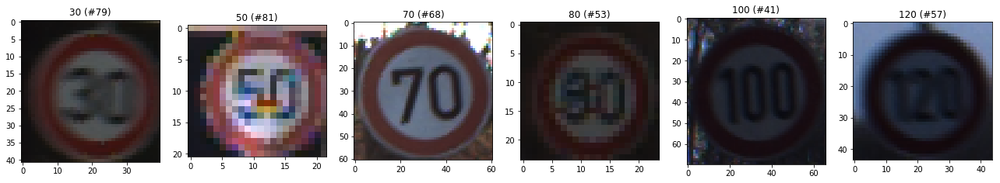

In [21]:
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

plt.figure(figsize=(30, 15))

unique_values, counts = np.unique(labels, return_counts=True)
classes = len(unique_values)

i = 1
for label in unique_values:
    # Pick the first image for each label.
    image = images[np.where(labels == label)[0][0]]
    plt.subplot(1, 8, i)
    plt.title("{0} (#{1})".format(label_names[label], counts[label]))
    i += 1
    plt.imshow(image)

### Ooops, different resolutions (as you can see from the axes)

We need to have all of them with the same resolution

In [0]:
import skimage.transform

images_32 = np.array([skimage.transform.resize(image, (32, 32)) for image in images])

In [23]:
# 379 samples, 32x32 resoltion, 3 color channels
images_32.shape

(379, 32, 32, 3)

## How to tackle this using neural networks?

In [0]:
X = images_32
y = labels

In [25]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((303, 32, 32, 3), (76, 32, 32, 3), (303,), (76,))

### Challenges for Images Recognition

1. Feeding all pixels into Dense Layers will work, but slow and many parameters 
1. Manual Feature extraction from images might work, but
   * is tedious and error prone
   * requires domain knowledge
   * needs frequent manual updates

### Convolutional networks will learn feature extraction before passing few features to Dense Layer Classifiers

https://towardsdatascience.com/simple-introduction-to-convolutional-neural-networks-cdf8d3077bac

### VGG: a basic network architecture

<img src="https://djcordhose.github.io/ml-workshop/img/vgg.png">

_VGG starts with a number of convolutional blocks for feature extraction and ends with a fully connected classifier_

## VGG contains a number of specialized neural network layers

### Most important: Convolutional Layers - filtering for features

* applying a number of filter kernels
* result of a filter kernel is like a manual feature extraction
* by stacking filter operations we hope to extract meaningful features  
* parameters of the kernerls are initialized randomly
* parameters are learned during training

### Keras Implementation

```model.add(Conv2D(filters=32, activation='relu'))```

https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers

### How do they work?

<img src='https://djcordhose.github.io/ml-workshop/img/cnn-kernels.gif'>

https://sigmoidprime.com/post/the-inner-workings-of-convolutional-nets/
<br>
https://twitter.com/wster/status/1079741301418049537

### Pooling - reducing size

* reduces computational load
* prevents overfitting by removing details

<img src='http://cs231n.github.io/assets/cnn/pool.jpeg'>

<img src='http://cs231n.github.io/assets/cnn/maxpool.jpeg'>

### Keras Implementation

#### Pooling
```model.add(MaxPooling2D())```

#### Flatten 2d to make it accessible to Dense layers
```model.add(Flatten())```

https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers

### Interactive exploration

* https://transcranial.github.io/keras-js/#/mnist-cnn
* https://cs.stanford.edu/people/karpathy/convnetjs/demo/cifar10.html
* http://setosa.io/ev/image-kernels/

### Regularization

* Dropout: sort of ensemble learning - only use a certain amount of all neurons for each batch
* BatchNormalization: normalize each batch to make it easier to digest for next layer

In [26]:
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, BatchNormalization, Flatten

model = tf.keras.Sequential()

model.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu', input_shape=(32, 32, 3))) 
# model.add(BatchNormalization())
model.add(MaxPooling2D())
# model.add(Dropout(rate=0.5))

model.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
# model.add(BatchNormalization())
model.add(MaxPooling2D())
# model.add(Dropout(rate=0.5))

model.add(Flatten())
model.add(Dense(256, activation='relu'))
# model.add(Dropout(rate=0.5))
model.add(Dense(classes, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        832       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 32)        8224      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 32)          0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 1

## CNNs typically train for a long time: Tensor Board allows us to track progress interactively

In [0]:
# https://www.tensorflow.org/tensorboard/r2/tensorboard_in_notebooks

import datetime, os

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [0]:
# clean slate
!rm -r logs

In [29]:
# you might have to expand/collapse side bar to see something here
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 1596), started 1:16:12 ago. (Use '!kill 1596' to kill it.)

In [30]:
# this is no fun on CPU, on a weak i5 this takes 10 minutes, on decent gpu just one minute
%%time

BATCH_SIZE=50
EPOCHS = 500

history = model.fit(X_train, y_train, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_split=0.2, verbose=0, callbacks=[tensorboard_callback])

CPU times: user 54 s, sys: 5.1 s, total: 59.1 s
Wall time: 56.8 s


## Evaluation

In [31]:
train_loss, train_accuracy = model.evaluate(X_train, y_train, batch_size=BATCH_SIZE, verbose=0)
train_loss, train_accuracy

(0.05816079270383366, 0.9933993)

In [32]:
test_loss, test_accuracy = model.evaluate(X_test, y_test, batch_size=BATCH_SIZE, verbose=0)
test_loss, test_accuracy

(0.6309255173331813, 0.90789473)

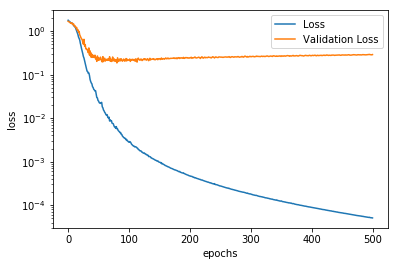

In [33]:
plt.xlabel('epochs')
plt.ylabel('loss')

plt.yscale('log')

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Loss', 'Validation Loss']);

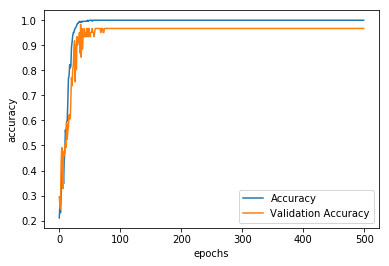

In [34]:
plt.xlabel('epochs')
plt.ylabel('accuracy')

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['Accuracy', 'Validation Accuracy']);

In [35]:
y_pred = model.predict(X).argmax(axis=1)
y_pred

array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 5, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,

In [36]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y, y_pred)
cm

array([[77,  0,  0,  2,  0,  0],
       [ 1, 78,  0,  1,  0,  1],
       [ 1,  0, 67,  0,  0,  0],
       [ 1,  0,  0, 52,  0,  0],
       [ 0,  0,  1,  0, 39,  1],
       [ 0,  0,  0,  0,  0, 57]])

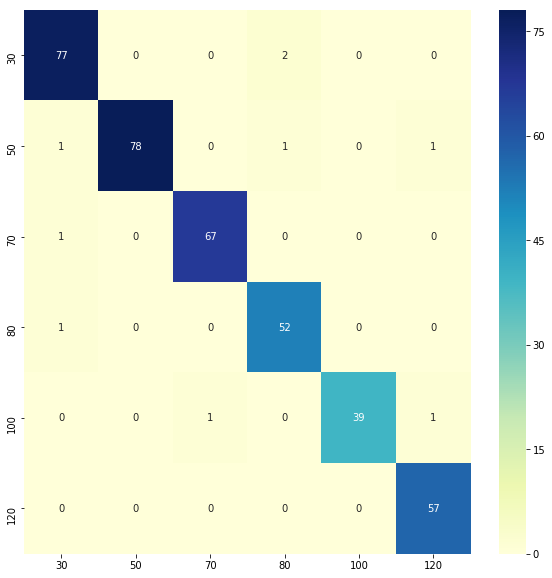

In [37]:
import seaborn as sns

figure = plt.figure(figsize=(10, 10))

sns.heatmap(cm, annot=True, cmap="YlGnBu", xticklabels=label_names, yticklabels=label_names);

### Trying samples exclusively from the test set

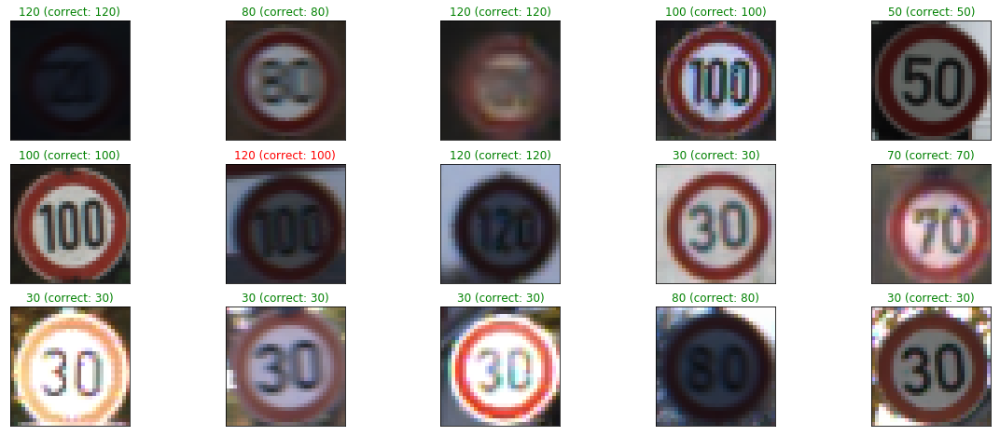

In [38]:
y_pred_test = model.predict(X_test).argmax(axis=1)

# Plot a random sample of 10 test images, their predicted labels and ground truth
figure = plt.figure(figsize=(20, 8))
for i, index in enumerate(np.random.choice(X_test.shape[0], size=15, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Display each image
    ax.imshow(np.squeeze(X_test[index]))
    predict_index = y_pred_test[index]
    true_index = y_test[index]
    # Set the title for each image
    ax.set_title("{} (correct: {})".format(label_names[predict_index], 
                                  label_names[true_index]),
                                  color=("green" if predict_index == true_index else "red"))

In [0]:
model.save('speed-signs-simple.h5')

# Exercise: Prevent Overfitting on our VGG model

_For CNN you use the same means of regularization as for other NNs_

Things you can try
* add Dropout (commented out so far)
* add BatchNormalization (commented out so far)
* train for more/less epochs
* other/more/less layers
* less/more nodes per layer
* different sequence, less/more filters

## Alternative: Standard CNN Architectures

<img src='https://cdn-images-1.medium.com/max/1600/1*kBpEOy4fzLiFxRLjpxAX6A.png'>

https://medium.com/towards-data-science/neural-network-architectures-156e5bad51ba

### ResNet
* basic ideas
  * depth does matter
  * 8x deeper than VGG
  * possible by using shortcuts and skipping final fc layer
  * prevents vanishing gradient problem
* https://keras.io/applications/#resnet50
* https://medium.com/towards-data-science/neural-network-architectures-156e5bad51ba

http://arxiv.org/abs/1512.03385
![Deep Learning](https://raw.githubusercontent.com/DJCordhose/ai/master/docs/img/residual.png)

### Mobilenet

_MobileNets: Efficient Convolutional Neural Networks for Mobile Vision Applications https://arxiv.org/abs/1704.04861_

_MobileNetV2: Inverted Residuals and Linear Bottlenecks https://arxiv.org/abs/1801.04381_

* reduces computational load from ResNet
* uses Depthwise Separable Convolutions, which is much more efficient, but can not perform as many different filters
* recommended to try first, often simply gets the job done

https://towardsdatascience.com/a-basic-introduction-to-separable-convolutions-b99ec3102728



## Keras Applications

Keras provides us with a lot of pre-defined network architectures for image classification (like ResNet and MobileNet)

https://keras.io/applications/

In [40]:
# from tensorflow.keras.applications.resnet50 import ResNet50

# https://keras.io/applications/#mobilenet
# https://arxiv.org/pdf/1704.04861.pdf
from tensorflow.keras.applications.mobilenet import MobileNet
# from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

# might take forever to train, so we might prefer mobile net
# model = ResNet50(classes=classes, weights=None, input_shape=(32, 32, 3))

model = MobileNet(classes=classes, weights=None, input_shape=(32, 32, 3))
# MobileNetV2: Inverted Residuals and Linear Bottlenecks: https://arxiv.org/abs/1801.04381
# model = MobileNetV2(classes=classes, weights=None, input_shape=(32, 32, 3))

model.compile(loss='sparse_categorical_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])

# Spares Dense Layers at the end, thus vastly reducing parameters
# If you wonder, final Logits layer has softmax activation: https://github.com/keras-team/keras-applications/blob/master/keras_applications/mobilenet_v2.py
model.summary()

Model: "mobilenet_1.00_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 33, 33, 3)         0         
_________________________________________________________________
conv1 (Conv2D)               (None, 16, 16, 32)        864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 16, 16, 32)        128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 16, 16, 32)        0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 16, 16, 32)        288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 16, 16, 32)  

In [0]:
# clean slate
!rm -r logs

In [42]:
# you might have to expand/collapse side bar to see something here
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 1596), started 1:17:15 ago. (Use '!kill 1596' to kill it.)

In [43]:
%%time

BATCH_SIZE=50
EPOCHS = 500

history = model.fit(X_train, y_train, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_split=0.2, verbose=0, callbacks=[tensorboard_callback])

CPU times: user 4min 29s, sys: 19.7 s, total: 4min 49s
Wall time: 4min 47s


In [44]:
train_loss, train_accuracy = model.evaluate(X_train, y_train, batch_size=BATCH_SIZE, verbose=0)
train_loss, train_accuracy

(0.3578545935897667, 0.9405941)

In [45]:
test_loss, test_accuracy = model.evaluate(X_test, y_test, batch_size=BATCH_SIZE, verbose=0)
test_loss, test_accuracy

(1.9840441597135443, 0.7368421)

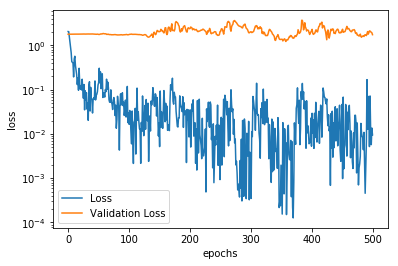

In [46]:
plt.xlabel('epochs')
plt.ylabel('loss')

plt.yscale('log')

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Loss', 'Validation Loss'])

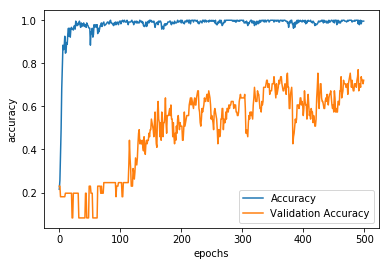

In [47]:
plt.xlabel('epochs')
plt.ylabel('accuracy')

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['Accuracy', 'Validation Accuracy'])

In [0]:
y_pred = model.predict(X).argmax(axis=1)

In [49]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y, y_pred)
cm

array([[73,  3,  2,  0,  1,  0],
       [ 5, 73,  0,  2,  0,  1],
       [ 1,  2, 61,  2,  0,  2],
       [ 2,  2,  3, 46,  0,  0],
       [ 1,  1,  0,  0, 34,  5],
       [ 0,  0,  1,  2,  0, 54]])

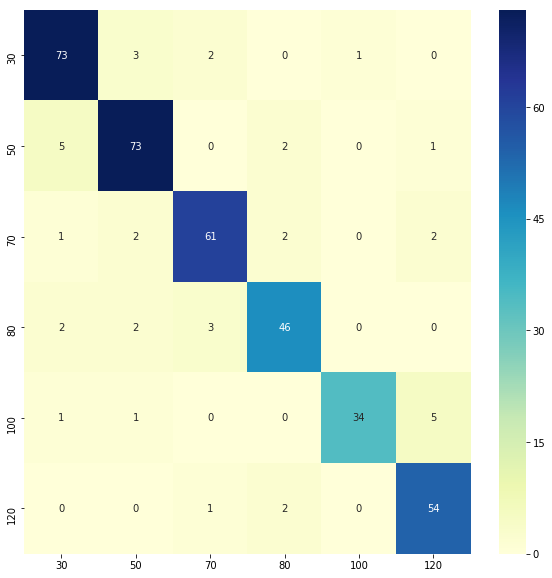

In [50]:
import seaborn as sns

figure = plt.figure(figsize=(10, 10))

sns.heatmap(cm, annot=True, cmap="YlGnBu", xticklabels=label_names, yticklabels=label_names)

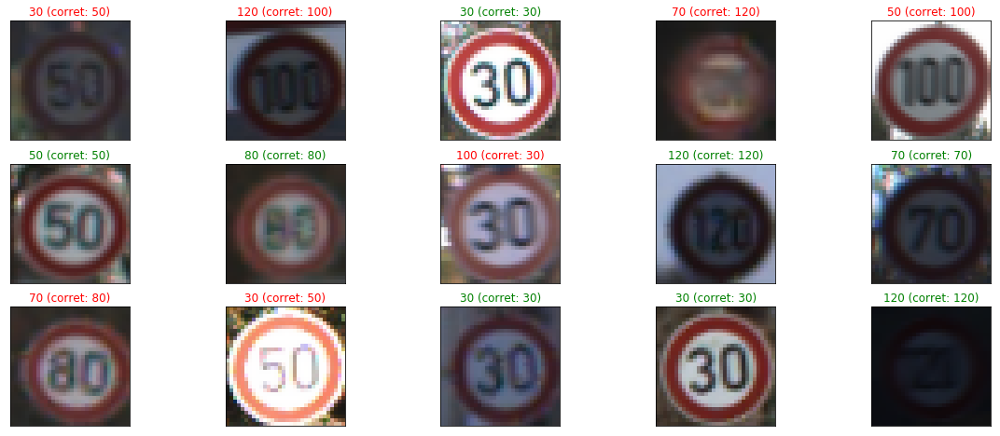

In [51]:
y_pred_test = model.predict(X_test).argmax(axis=1)

# Plot a random sample of 10 test images, their predicted labels and ground truth
figure = plt.figure(figsize=(20, 8))
for i, index in enumerate(np.random.choice(X_test.shape[0], size=15, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Display each image
    ax.imshow(np.squeeze(X_test[index]))
    predict_index = y_pred_test[index]
    true_index = y_test[index]
    # Set the title for each image
    ax.set_title("{} (corret: {})".format(label_names[predict_index], 
                                  label_names[true_index]),
                                  color=("green" if predict_index == true_index else "red"))

In [0]:
model.save('speed-signs-mobilenet.h5')

## Final Option: use the network pretrained on imagenet and retrain the classifier

* You can get the pre-defined network architectures pre-trained on a generic image data set (ImageNet)
* You can either use them as is
* Or retrain (fine tune weights) with your own images
* https://keras.io/applications/
* Might be helpful if you do not have a lot of data
* If a pre-trained network is helpful depends on whether your data looks similar to the data it has been pre-trained on

VGG16
* https://keras.io/applications/#vgg16
* https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html
* https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/5.3-using-a-pretrained-convnet.ipynb
* https://notebooks.azure.com/djcordhose/projects/tss-workshop/html/cnn-imagenet-retrain.ipynb

MobilNet V2 (our choice)
* https://towardsdatascience.com/transfer-learning-using-mobilenet-and-keras-c75daf7ff299
* https://www.tensorflow.org/beta/tutorials/images/transfer_learning



### Stripping off classifier

In [53]:
mobilnetv2_model = MobileNetV2(weights='imagenet', input_shape=(224, 224, 3))
len(mobilnetv2_model.layers)

157

In [54]:
mobilnetv2_model.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
_______________________________________________________________________________

In [55]:
mobilnetv2_model_base = MobileNetV2(weights='imagenet', include_top=False, input_shape=(32, 32, 3))
len(mobilnetv2_model_base.layers)

/tensorflow-2.0.0-rc0/python3.6/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


9412608/9406464 [==============================] - 0s 0us/step


155

In [0]:
# mobilnetv2_model_base.summary()

In [0]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D

# try and vary between .4 and .75
drop_out = 0.50

inputs = mobilnetv2_model_base.output

# like mobilnet would do it
x = GlobalAveragePooling2D()(inputs)

# alternative, but with many more parameters
# x = Flatten()(inputs)

# quite surprisingly there is no final classifier in mobil net, we can have it, but we are also leaving it out for now

# x = Dense(256, activation='relu')(x)
# x = Dropout(drop_out)(x)

# x = Dense(256, activation='relu')(x)
# x = Dropout(drop_out)(x)

# softmax activation, 6 categories
predictions = Dense(classes, activation='softmax')(x)

In [0]:
transfer_model = Model(inputs=mobilnetv2_model_base.input, outputs=predictions)
# transfer_model.summary()

In [0]:
transfer_model.compile(loss='sparse_categorical_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])

In [60]:
!rm -r logs

rm: cannot remove 'log': No such file or directory


In [61]:
# you might have to expand/collapse side bar to see something here
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 1596), started 1:22:16 ago. (Use '!kill 1596' to kill it.)

In [62]:
%%time

BATCH_SIZE=50
EPOCHS = 500

history = transfer_model.fit(X_train, y_train, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_split=0.1, verbose=0, callbacks=[tensorboard_callback])

CPU times: user 5min 47s, sys: 25.7 s, total: 6min 13s
Wall time: 6min 8s


In [63]:
train_loss, train_accuracy = transfer_model.evaluate(X_train, y_train, batch_size=BATCH_SIZE, verbose=0)
train_loss, train_accuracy

(1.427196718678616, 0.9339934)

In [64]:
test_loss, test_accuracy = transfer_model.evaluate(X_test, y_test, batch_size=BATCH_SIZE, verbose=0)
test_loss, test_accuracy

(2.1881673147803857, 0.8684211)

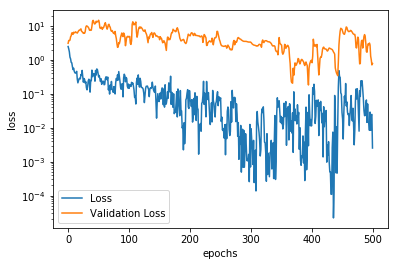

In [65]:
plt.xlabel('epochs')
plt.ylabel('loss')

plt.yscale('log')

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Loss', 'Validation Loss'])

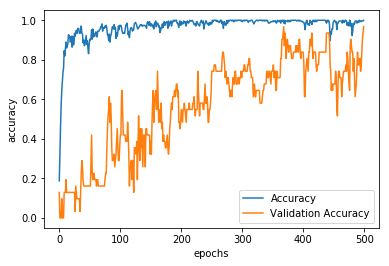

In [66]:
plt.xlabel('epochs')
plt.ylabel('accuracy')

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.legend(['Accuracy', 'Validation Accuracy'])

In [0]:
y_pred = transfer_model.predict(X).argmax(axis=1)

In [68]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y, y_pred)
cm

array([[76,  2,  0,  1,  0,  0],
       [ 0, 79,  0,  0,  0,  2],
       [ 0,  0, 68,  0,  0,  0],
       [ 0,  0,  0, 52,  0,  1],
       [ 0,  0,  0,  0, 40,  1],
       [ 0,  0, 23,  0,  0, 34]])

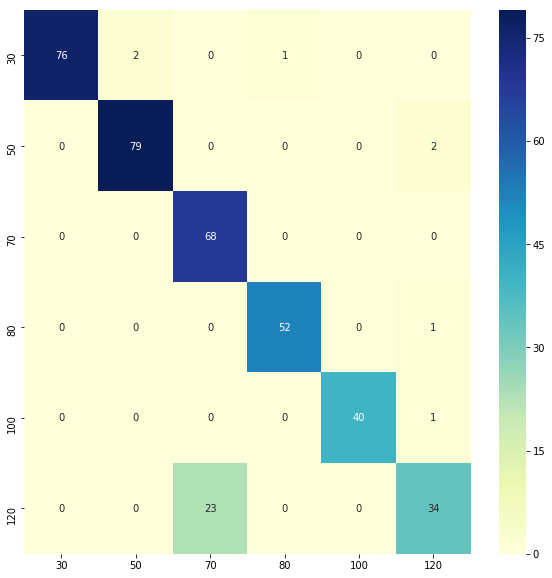

In [69]:
import seaborn as sns

figure = plt.figure(figsize=(10, 10))

sns.heatmap(cm, annot=True, cmap="YlGnBu", xticklabels=label_names, yticklabels=label_names)

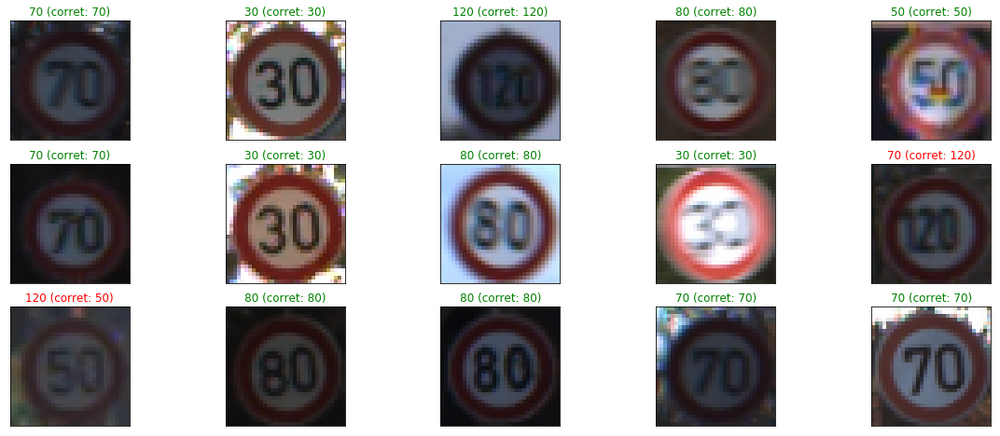

In [70]:
y_pred_test = transfer_model.predict(X_test).argmax(axis=1)

# Plot a random sample of 10 test images, their predicted labels and ground truth
figure = plt.figure(figsize=(20, 8))
for i, index in enumerate(np.random.choice(X_test.shape[0], size=15, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Display each image
    ax.imshow(np.squeeze(X_test[index]))
    predict_index = y_pred_test[index]
    true_index = y_test[index]
    # Set the title for each image
    ax.set_title("{} (corret: {})".format(label_names[predict_index], 
                                  label_names[true_index]),
                                  color=("green" if predict_index == true_index else "red"))

In [0]:
model.save('speed-signs-mobilenet-transfer.h5')

## Final Option: use the network pretrained on imagenet and retrain the classifier

VGG16
* https://keras.io/applications/#vgg16
* https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html
* https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/5.3-using-a-pretrained-convnet.ipynb
* https://notebooks.azure.com/djcordhose/projects/tss-workshop/html/cnn-imagenet-retrain.ipynb

MobilNet
* https://towardsdatascience.com/transfer-learning-using-mobilenet-and-keras-c75daf7ff299